# Imports e configurações

Leia o arquivo [README.md](../README.md) para detalhes sobre a base o projeto.

Leia o arquivo de [01_dicionario_de_dados.md](../referencias/01_dicionario_de_dados.md) para detalhes sobre a base.

Ao importar esse arquivo [src.graficos](./src/graficos.py), em tema seaborn é aplicado.

In [1]:
import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from src.auxiliares import fnc_describe_numericas_personalizado
from src.config import DADOS_COMPLETOS, DADOS_LIMPOS, DADOS_ORIGINAIS, DCT_CATEGORICAS_ORDENADAS, RANDOM_STATE 
from src.graficos import fnc_correlacao_formatada, PALETTE_TEMPERATURA, SCATTER_ALPHA

In [2]:
pd.options.display.max_rows = 15
pd.options.display.max_columns = None
pd.options.display.float_format = '{:.2f}'.format

# Carregando o arquivo archive.zip

Origem: https://www.kaggle.com/datasets/camnugent/california-housing-prices/data

- `median_income`: renda mediana no grupo de blocos (em dezenas de milhares de dólares)
- `housing_median_age`: idade mediana das casas no grupo de blocos
- `total_rooms`: número cômodos no grupo de blocos
- `total_bedrooms`: número de quartos no grupo de blocos
- `population`: população do grupo de blocos
- `households`: domicílios no grupo de blocos
- `latitude`: latitude do grupo de blocos
- `longitude`: longitude do grupo de blocos
- `ocean_proximity`: proximidade do oceano
  - `NEAR BAY`: perto da baía
  - `<1H OCEAN`: a menos de uma hora do oceano
  - `INLAND`: no interior
  - `NEAR OCEAN`: perto do oceano
  - `ISLAND`: ilha
- `median_house_value`: valor mediano das casas no grupo de blocos (em dólares)

In [3]:
df = pd.read_csv(
    DADOS_ORIGINAIS,
    compression='zip',
    sep=',',
)

# Conhecendo os dados

Ao analisar o info() abaixo, vemos que a coluna 'total_bedrooms' tem registros nulos.
Também podemos ver que nossa base tem o total de 20.640 observações.

In [4]:
i=2

display(
    pd.concat((
        df.head(n=i),
        df.sample(n=i, random_state=RANDOM_STATE),
        df.tail(n=i),
    ))
)

del i

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.00,880.00,129.00,322.00,126.00,8.33,452600.00,NEAR BAY
1,-122.22,37.86,21.00,7099.00,1106.00,2401.00,1138.00,8.30,358500.00,NEAR BAY
8748,-118.36,33.82,36.00,1784.00,311.00,901.00,293.00,6.22,339000.00,<1H OCEAN
5391,-118.39,34.03,39.00,1366.00,375.00,1237.00,370.00,3.72,230900.00,<1H OCEAN
20638,-121.32,39.43,18.00,1860.00,409.00,741.00,349.00,1.87,84700.00,INLAND
20639,-121.24,39.37,16.00,2785.00,616.00,1387.00,530.00,2.39,89400.00,INLAND


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [6]:
fnc_describe_numericas_personalizado(df)

/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)
/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)


,tipo,inteiros,nulo,count,nulo/count,soma,unicos,moda,mean,std,AMP,MAD,VAR,CV,qtd_3SZ<,qtd_LOWER,qtd_01%,3SZ<,LOWER,min,01%,25%,50%,75%,99%,max,UPPER,3SZ>,qtd_99%,qtd_UPPER,qtd_3SZ>,skewness,kurtosis,dist_normal,pvalue,teste_normalidade
longitude,float64,0.010320,0,20640,0.000000,-2467918.700000,844,-118.309998,-119.569704,2.003532,10.040000,1.830206,4.014139,-1.675618,0,0,203,-125.580300,-127.485001,-124.349998,-123.220001,-121.800003,-118.489998,-118.010002,-116.290001,-114.309998,-112.324997,-113.559109,204,0,0,-0.297801,-1.330152,False,0,Kolmogorov-Smirnov
latitude,float64,0.012694,0,20640,0.000000,735441.620000,862,34.060001,35.631861,2.135952,9.410000,1.975024,4.562293,5.994501,0,0,189,29.224004,28.260000,32.540001,32.680000,33.930000,34.259998,37.709999,40.626099,41.950001,43.380001,42.039719,207,0,0,0.465953,-1.117760,False,0,Kolmogorov-Smirnov
housing_median_age,float64,1.000000,0,20640,0.000000,591119.000000,52,52.000000,28.639486,12.585558,51.000000,10.551539,158.396260,43.944775,0,0,124,-9.117186,-10.500000,1.000000,4.000000,18.000000,29.000000,37.000000,52.000000,52.000000,65.500000,66.396159,0,0,0,0.060331,-0.800629,False,0,Kolmogorov-Smirnov
total_rooms,float64,1.000000,0,20640,0.000000,54402150.000000,5926,1527.000000,2635.763081,2181.615252,39318.000000,1344.462236,4759445.105939,82.769775,0,0,206,-3909.082673,-1102.625000,2.000000,164.000000,1447.750000,2127.000000,3148.000000,11212.110352,39320.000000,5698.375000,9180.608836,207,1287,373,4.147344,32.630928,False,0,Kolmogorov-Smirnov
total_bedrooms,float64,1.000000,207,20433,0.010131,10990309.000000,1923,280.000000,537.870553,421.385070,6444.000000,270.923606,177565.377281,78.343216,0,0,201,-726.284658,-230.500000,1.000000,36.000000,296.000000,435.000000,647.000000,2221.360107,6445.000000,1173.500000,1802.025763,205,1271,368,3.459546,21.985575,False,0,Kolmogorov-Smirnov
population,float64,1.000000,0,20640,0.000000,29421840.000000,3888,891.000000,1425.476744,1132.462122,35679.000000,714.237277,1282470.457233,79.444450,0,0,205,-1971.909621,-620.000000,3.000000,88.000000,787.000000,1166.000000,1725.000000,5805.830078,35682.000000,3132.000000,4822.863109,207,1196,342,4.935858,73.553116,False,0,Kolmogorov-Smirnov
households,float64,1.000000,0,20640,0.000000,10310499.000000,1815,306.000000,499.539680,382.329753,6081.000000,247.195367,146176.039900,76.536415,0,0,202,-647.449578,-207.500000,1.000000,31.000000,280.000000,409.000000,605.000000,1982.660034,6082.000000,1092.500000,1646.528939,207,1220,363,3.410438,22.057987,False,0,Kolmogorov-Smirnov
median_income,float64,0.006395,0,20640,0.000000,79890.649500,12928,3.125000,3.870671,1.899822,14.500200,1.401614,3.609323,49.082489,0,0,207,-1.828794,-0.706375,0.499900,1.069631,2.563400,3.534800,4.743250,10.596540,15.000100,8.013025,9.570136,207,681,345,1.646657,4.952524,False,0,Kolmogorov-Smirnov
median_house_value,float64,1.000000,0,20640,0.000000,4269504061.000000,3842,500001.000000,206855.816909,115395.615874,485002.000000,91170.439944,13316148163.035124,55.785530,0,0,199,-139331.030714,-98087.500000,14999.000000,50000.000000,119600.000000,179700.000000,264725.000000,500001.000000,500001.000000,482412.500000,553042.664532,0,1071,0,0.977763,0.327870,False,0,Kolmogorov-Smirnov


In [7]:
coluna_target = ['median_house_value']

# Colunas Numericas
colunas_numericas = df.select_dtypes(include='number').columns.to_list()
colunas_numericas.remove(coluna_target[0])

# Colunas categoricas
colunas_categoricas = df.select_dtypes(exclude='number').columns.to_list()


print('coluna_target =', coluna_target)
print('colunas_numericas =', colunas_numericas)
print('colunas_categoricas =', colunas_categoricas)


coluna_target = ['median_house_value']
colunas_numericas = ['longitude', 'latitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income']
colunas_categoricas = ['ocean_proximity']


## O que sabemos até aqui:
- A coluna 'median_house_value' é nosso target e tem uma escala bem diferente dos demais valores [no futuro uma mudança de escala pode ajudar no modelo];
- Temos 207 registros nulos em 'total_bedrooms' que precisam ser tradados (aproximadamente 1%) [Podemos excluir esses registros, colocar a mediana, média ou a moda, ou ainda colocar zero assumindo ser uma região não residencial e sem quartos de dormir];
- Algumas colunas podem ter seu tipo dentro do conjunto dos numeros naturais(inteiros positivos);
- Nâo temos colunas numérias de valores únicos que precisem ser desconsideradas;
- Não temos outliers mínimos, mas temos ouliers máximos por diversas métricas;
- Não temos normalidade nos dados, considerando o KS, e pela curtose podemos notar uma calda longa a direita em várias colunas. [As cores de 'calor' também destacam uma grande distancia entre as mediana/media com os valores máximos encontrados. O desvio padrão e a amplitude também confirmam essa afirmação];

Alguns pontos acima podem ser analisados graficamente mais adiante para melhorar essa percepção e o entendimento.

## Otimizando o dataframe com variáveis numericas antes de seguir com outras análises

In [8]:
# reduzindo o tamanho das variáveis numericas
for coluna in coluna_target + colunas_numericas:
    # todas se tornam o menor float possível de acordo com o conteúdo
    # apenas as que podem ser naturais são transformadas para o menor natural possível
    for tipo_base in ('float', 'unsigned'):
        df[coluna] = pd.to_numeric(df[coluna], downcast=tipo_base)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float32
 1   latitude            20640 non-null  float32
 2   housing_median_age  20640 non-null  uint8  
 3   total_rooms         20640 non-null  uint16 
 4   total_bedrooms      20433 non-null  float32
 5   population          20640 non-null  uint16 
 6   households          20640 non-null  uint16 
 7   median_income       20640 non-null  float32
 8   median_house_value  20640 non-null  uint32 
 9   ocean_proximity     20640 non-null  object 
dtypes: float32(4), object(1), uint16(3), uint32(1), uint8(1)
memory usage: 705.6+ KB


A coluna 'total_bedrooms' não pode ser convertida para natural por conter valores NaN[nulos]. Apenas inteiros e floats podem ser nulos, então, usaremos o tipo float otimizado para 32 bits, até decidirmos o que fazer com os valores nulos e eventualmente com decimais.

O tamanho do dataframe foi reduzido pela metade com essa otimização, mas não faz muita diferença para poucos registros que temos.

## variáveis texto/categoricas

In [9]:
df[colunas_categoricas].describe()

,ocean_proximity
count,20640
unique,5
top,<1H OCEAN
freq,9136


In [10]:
df[colunas_categoricas].value_counts().to_frame()

,count
ocean_proximity,
<1H OCEAN,9136
INLAND,6551
NEAR OCEAN,2658
NEAR BAY,2290
ISLAND,5


- Acima vemos que a variável texto de fato é categórica;
- Vemos que existe um desbalanceamento de volume, tanto da moda em relação às demais quando da que menos aparece;
- O número de observações de ISLAND não permitirá qualquer treinamento com ela [Podemos simplesmente eliminar esses 5 registros. Olhando para o mapa da Califórnia poderiamos transformar 'ISLAND' em 'NEAR OCEAN'. Um eventual modelo pode errar muito para esses casos em qualquer das decisões. Essa decisão precisa ser tomada antes de otimizar a coluna como uma categorica];

## Outras analises para conhecer a base

In [11]:
# verificando registros duplicados
df[df.duplicated()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


### Analisando os registros contendo nulos na coluna 'total_bedrooms'

In [12]:
df_nulos = df[df.isnull().any(axis=1)]

df_nulos.sample(n=5, random_state=RANDOM_STATE,)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
4043,-118.50,34.17,37,880,NaN,369,155,4.14,303600,<1H OCEAN
5059,-118.35,34.01,35,3776,NaN,1583,749,3.55,332100,<1H OCEAN
19122,-122.65,38.25,23,4030,NaN,1852,778,3.40,193300,<1H OCEAN
8383,-118.36,33.96,26,3543,NaN,2742,951,2.55,151300,<1H OCEAN
20267,-119.19,34.20,18,3620,NaN,3171,779,3.34,220500,NEAR OCEAN


In [13]:
display('Registros nulos', df_nulos.describe())
display('Todos os registros', df.describe())

'Registros nulos'

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,207.00,207.00,207.00,207.00,0.00,207.00,207.00,207.00,207.00
mean,-119.47,35.50,29.27,2562.60,NaN,1477.77,510.02,3.82,206007.28
std,2.00,2.10,11.96,1787.27,NaN,1057.45,386.12,1.96,111638.21
min,-124.13,32.66,4.00,154.00,NaN,37.00,16.00,0.85,45800.00
25%,-121.81,33.97,19.00,1307.50,NaN,781.00,258.00,2.56,128750.00
50%,-118.49,34.20,30.00,2155.00,NaN,1217.00,427.00,3.41,175000.00
75%,-117.99,37.49,38.00,3465.00,NaN,1889.50,628.00,4.62,267700.00
max,-114.59,40.92,52.00,11709.00,NaN,7604.00,3589.00,15.00,500001.00


'Todos os registros'

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.00,20640.00,20640.00,20640.00,20433.00,20640.00,20640.00,20640.00,20640.00
mean,-119.57,35.63,28.64,2635.76,537.87,1425.48,499.54,3.87,206855.82
std,2.00,2.14,12.59,2181.62,421.38,1132.46,382.33,1.90,115395.62
min,-124.35,32.54,1.00,2.00,1.00,3.00,1.00,0.50,14999.00
25%,-121.80,33.93,18.00,1447.75,296.00,787.00,280.00,2.56,119600.00
50%,-118.49,34.26,29.00,2127.00,435.00,1166.00,409.00,3.53,179700.00
75%,-118.01,37.71,37.00,3148.00,647.00,1725.00,605.00,4.74,264725.00
max,-114.31,41.95,52.00,39320.00,6445.00,35682.00,6082.00,15.00,500001.00


In [14]:
df_nulos[['latitude', 'longitude']].head()

,latitude,longitude
290,37.77,-122.16
341,37.75,-122.17
538,37.78,-122.28
563,37.75,-122.24
696,37.69,-122.10


- Pelas localizações, podemos ver que os registros nulos estão espalhados em diferentes pontos do estado da Califórnia;
- Pelas medianas, minimos e máximos, vemos que os registros nulos não se diferem de forma signicativa dos demais registros da base [o que permitiria usar uma mediana ou outra métrica para preencher os dados faltantes];
- Os dados são do ano de 1990, então olhar hoje pelo maps e street view em 2025 não seria confiável. Apesar disso, olhando os 5 primeiros registros nulos vemos regiões onde há sim residências, então deveriam haver quartos de dormir [total_bedrooms];
- Por falta de mais informações para decidir o que fazer com esses registros nulos, o mais seguro é desconsiderá-los para não enviesar um futuro modelo. Vamos excluir os registros nulos abaixo;
- Uma vez sem nulos a colunas 'total_bedrooms' pode se tornar um número natural;


Aproveitando essa etapa de limpeza dos dados, vamos também eliminar as 5 observações 'ISLAND' da base e transformar a coluna 'ocean_proximity' em categórica, otimizando a base.

In [15]:
df = df[df[colunas_categoricas[0]] != 'ISLAND']
df[colunas_categoricas] = df[colunas_categoricas].astype('category')

df = df[~ df.isnull().any(axis=1)]
df['total_bedrooms'] = pd.to_numeric(df['total_bedrooms'], downcast='unsigned')

df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 20428 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20428 non-null  float32 
 1   latitude            20428 non-null  float32 
 2   housing_median_age  20428 non-null  uint8   
 3   total_rooms         20428 non-null  uint16  
 4   total_bedrooms      20428 non-null  uint16  
 5   population          20428 non-null  uint16  
 6   households          20428 non-null  uint16  
 7   median_income       20428 non-null  float32 
 8   median_house_value  20428 non-null  uint32  
 9   ocean_proximity     20428 non-null  category
dtypes: category(1), float32(3), uint16(4), uint32(1), uint8(1)
memory usage: 678.5 KB


In [16]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20428.00,20428.00,20428.00,20428.00,20428.00,20428.00,20428.00,20428.00,20428.00
mean,-119.57,35.63,28.63,2636.76,537.90,1425.13,499.49,3.87,206821.93
std,2.00,2.14,12.59,2185.45,421.43,1133.28,382.33,1.90,115412.34
min,-124.35,32.54,1.00,2.00,1.00,3.00,1.00,0.50,14999.00
25%,-121.80,33.93,18.00,1450.00,296.00,788.00,280.00,2.56,119475.00
50%,-118.50,34.26,29.00,2127.00,435.00,1166.00,409.00,3.54,179700.00
75%,-118.01,37.72,37.00,3143.25,647.00,1723.00,604.00,4.74,264700.00
max,-114.31,41.95,52.00,39320.00,6445.00,35682.00,6082.00,15.00,500001.00


In [17]:
df[colunas_categoricas].value_counts().to_frame()

,count
ocean_proximity,
<1H OCEAN,9034
INLAND,6496
NEAR OCEAN,2628
NEAR BAY,2270


- Após a exclusão de aproximadamente 1% da base, não tivemos mudanças significativas nas medidas de mediana, media, mínimos e máximos;
- Não trouxe mudança significativa no tamanho do dataframe;

## Analisando correlação com a coluna target [median_house_value]

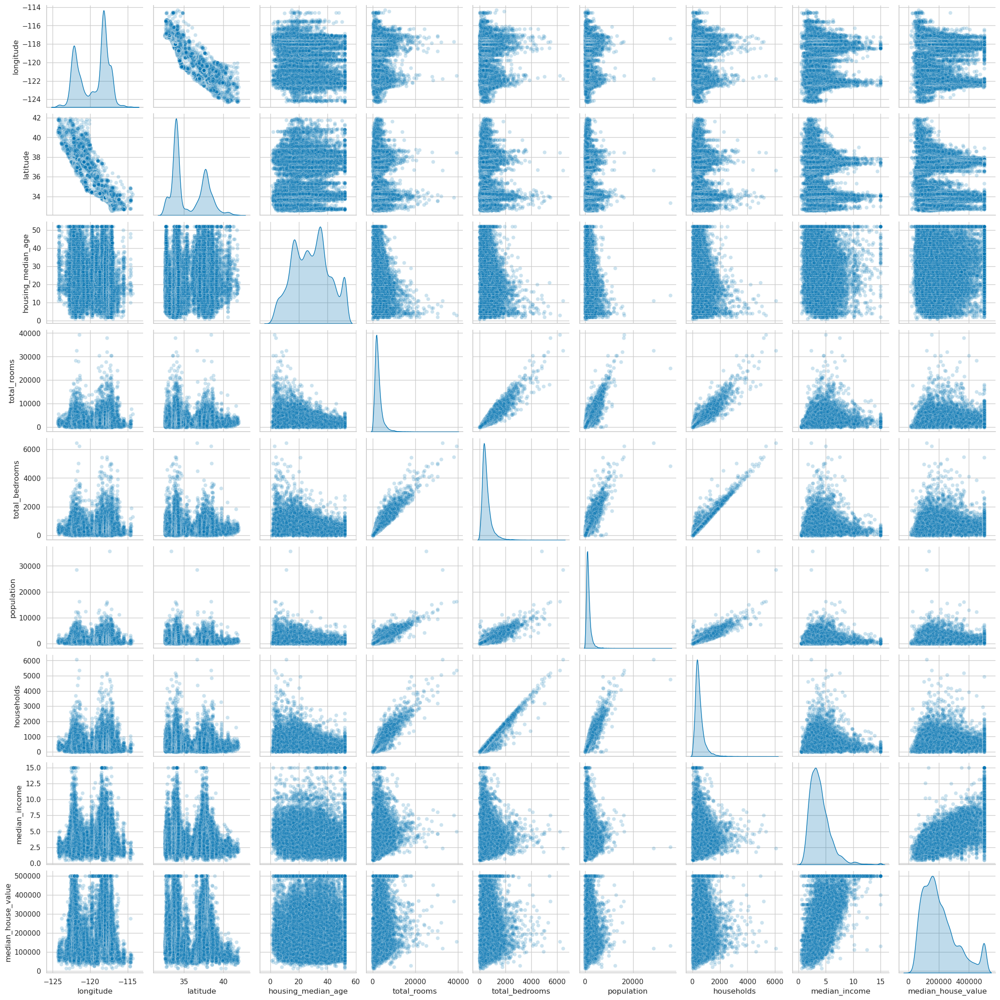

In [18]:
sns.pairplot(df, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA));

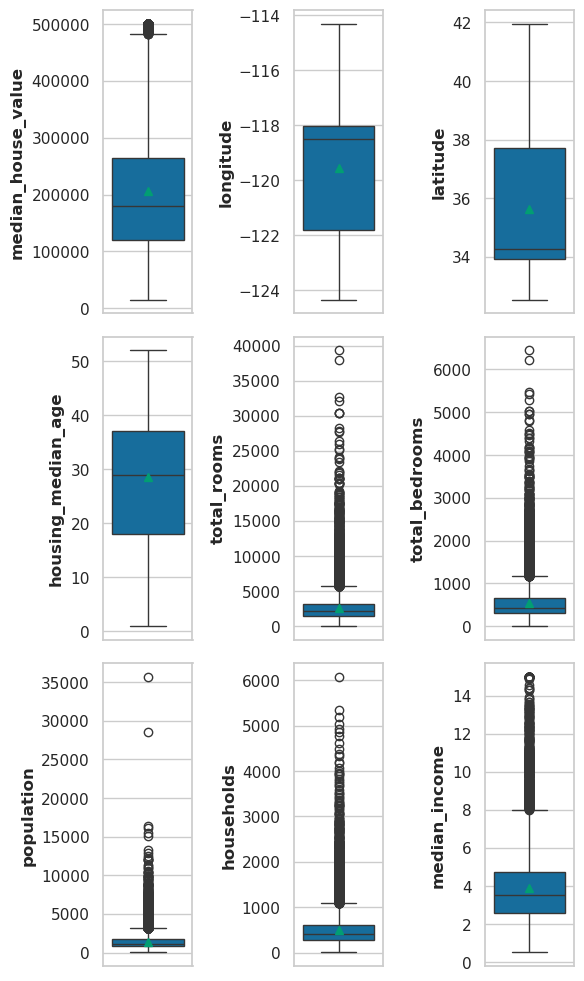

In [19]:
fig, axs = plt.subplots(3, 3, figsize=(6, 10))

for ax, coluna in zip(axs.flatten(), coluna_target + colunas_numericas):
    sns.boxplot(data=df, y=coluna, ax=ax, showmeans=True)
    ax.set_ylabel(ax.get_ylabel(), weight='bold')  

plt.tight_layout()

plt.show()

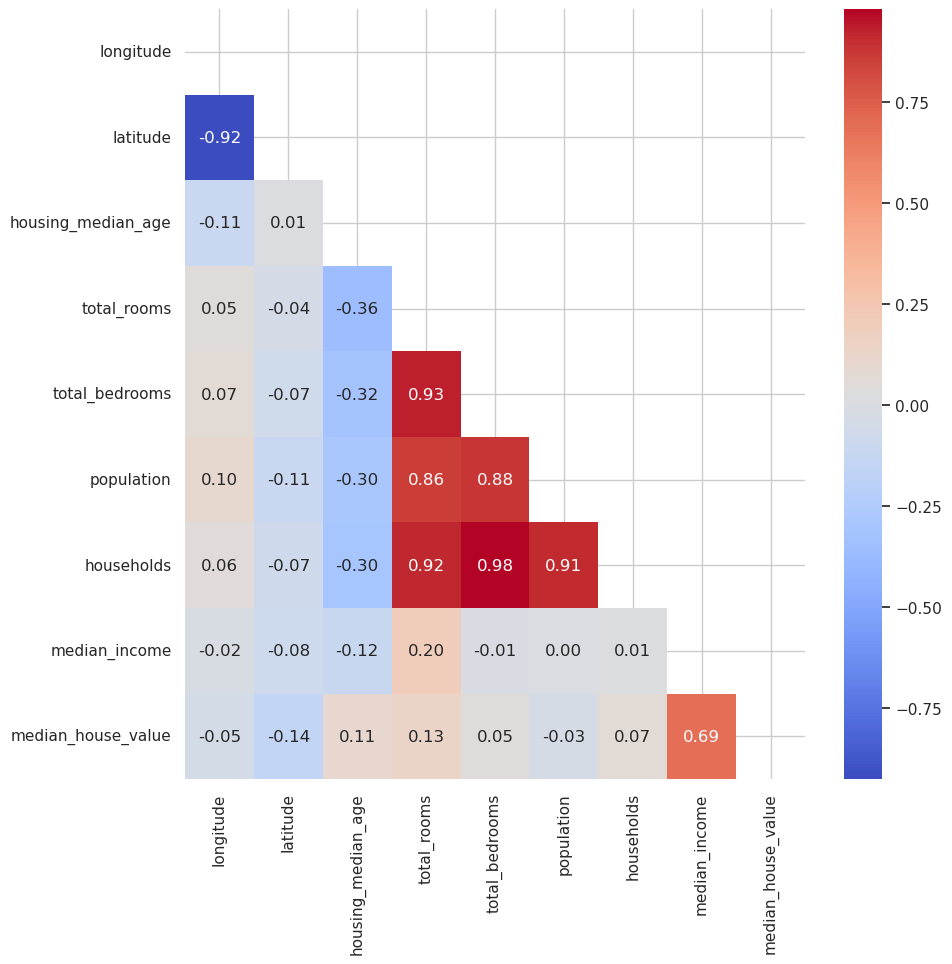

,latitude,longitude,population,total_bedrooms,households,housing_median_age,total_rooms,median_income,median_house_value
median_house_value,-0.14,-0.05,-0.03,0.05,0.07,0.11,0.13,0.69,1.00


In [20]:
fnc_correlacao_formatada(df, coluna_target=coluna_target[0], flg_mostrar_dataframe=True, palette=PALETTE_TEMPERATURA)

### Analisando os gráficos e dados acima
- Os KDEs na diagonal do pairplot reforçam a não normalidade das variáveis [isso não afeta muito modelos de regressão, mas podemos experimentar algumas normalizações e padronizações].
- Temos caldas alongadas nos KDEs para os valores máximos [precisaremos tratar esses outliers tentando não impactar negativamente no desempenho do modelo, decidiremos mais adiante, mas podemos eliminar registros acima de uma métrica de corte ou trocar o valor da medida outlier pela métrica calculada, que pode ser tendencioso];
Os boxplots confirmam a existência dos outliers em grandes valores;
- Nos gráficos de dispersão, podemos ver um limite de valores superiores nas colunas 'housing_median_age', 'median_income' e 'median_house_value', podendo indicar uma manipulação de valores maiores que um limiar para remover outliers ou inicio dos registros no caso da idade [isso pode também prejudicar o desempenho de um futuro modelo, veremos o que fazer ao tratarmos outliers];
- Vemos uma correlação apenas entre as colunas 'median_income' e 'median_house_value';
- Uma análise mais profunda de correlação pode encontrar mais correlações combinando colunas, como as de localização, que fazem sentido para valores de imóveis;
- Novas features combinando as existentes podem também ser relevantes para o modelo;

Uma observação... Os gráficos de dispersão das longitudes e latitudes mostram um formato próximo do mapa do estado da Califórnia. O que era esperado, claro.

# Engenharia de Atributos - Criando novas colunas com o intuito de tentar encontrar novas correlações

Algumas variáveis novas:

- Faixas para salário mediano anual
- Faixas para densidade da população
- Faixas para a idade dos imoveis
- Cômodos por domicílio
- Pessoas por domicílio
- Quartos por cômodos

## Analizando a distribuição para criar as faixas

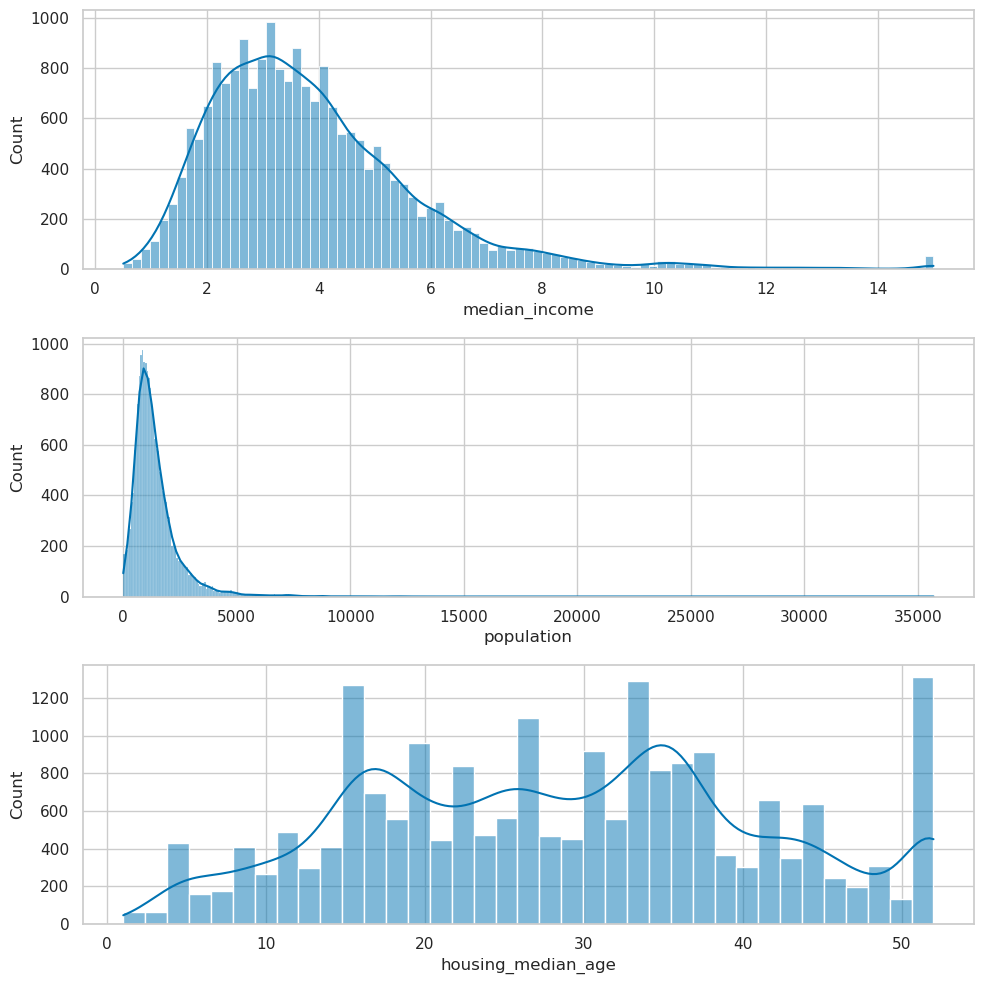

In [21]:
colunas_faixas = ['median_income', 'population', 'housing_median_age']

fig, axs = plt.subplots(nrows=len(colunas_faixas), ncols=1, figsize=(10, 10))

for ax, coluna in zip(axs.flatten(), colunas_faixas):
    sns.histplot(data=df, x=coluna, kde=True, ax=ax)

plt.tight_layout()

plt.show()

### Reanalizando a população
Os outliers em população não permitiram uma analise acima.

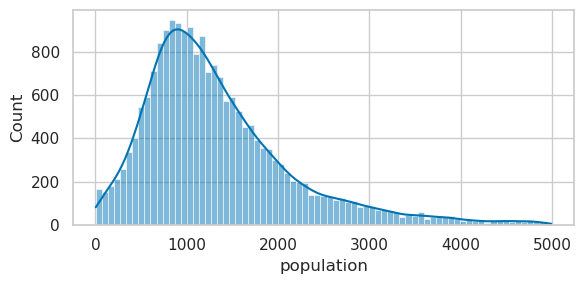

In [22]:
fig, ax = plt.subplots(figsize=(6, 3))

sns.histplot(data=df[df['population'] < 5e3], x='population', kde=True, ax=ax)

plt.tight_layout()

plt.show()

## Criando as faixas após análise gráfica

In [23]:
dct_categoricas_ordenadas = {
    'bins_median_income_cat': [0, 1.5, 3, 4.5, 6, np.inf],
    'labels_median_income_cat': ['0 <= x < 1.5', '1.5 <= x < 3', '3 <= x < 4.5', '4.5 <= x < 6', '6 <= x'],

    'bins_housing_median_age_cat': [0, 10, 20, 30, 40, np.inf],
    'labels_housing_median_age_cat': ['0 <= x < 10', '10 <= x < 20', '20 <= x < 30', '30 <= x < 40', '40 <= x'],

    'bins_population_cat': [0, 500, 1000, 1500, 2000, np.inf],
    'labels_population_cat': ['0 <= x < 500', '500 <= x < 1000', '1000 <= x < 1500', '1500 <= x < 2000', '2000 <= x'],
}

df['median_income_cat'] = pd.cut(
    x=df['median_income'],
    bins=dct_categoricas_ordenadas['bins_median_income_cat'],
    labels=dct_categoricas_ordenadas['labels_median_income_cat'],
    right=False,
    ordered=True,
)

df['housing_median_age_cat'] = pd.cut(
    x=df['housing_median_age'],
    bins=dct_categoricas_ordenadas['bins_housing_median_age_cat'],
    labels=dct_categoricas_ordenadas['labels_housing_median_age_cat'],
    right=False,
    ordered=True,
)
	
df['population_cat'] = pd.cut(
    x=df['population'],
    bins=dct_categoricas_ordenadas['bins_population_cat'],
    labels=dct_categoricas_ordenadas['labels_population_cat'],
    right=False,
    ordered=True,
)

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20428 entries, 0 to 20639
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   longitude               20428 non-null  float32 
 1   latitude                20428 non-null  float32 
 2   housing_median_age      20428 non-null  uint8   
 3   total_rooms             20428 non-null  uint16  
 4   total_bedrooms          20428 non-null  uint16  
 5   population              20428 non-null  uint16  
 6   households              20428 non-null  uint16  
 7   median_income           20428 non-null  float32 
 8   median_house_value      20428 non-null  uint32  
 9   ocean_proximity         20428 non-null  category
 10  median_income_cat       20428 non-null  category
 11  housing_median_age_cat  20428 non-null  category
 12  population_cat          20428 non-null  category
dtypes: category(4), float32(3), uint16(4), uint32(1), uint8(1)
memory usage: 738.9 KB

In [24]:
joblib.dump(
    value=dct_categoricas_ordenadas,
    filename=DCT_CATEGORICAS_ORDENADAS,
)

dct_categoricas_ordenadas = joblib.load(filename=DCT_CATEGORICAS_ORDENADAS)
dct_categoricas_ordenadas

{'bins_median_income_cat': [0, 1.5, 3, 4.5, 6, inf],
 'labels_median_income_cat': ['0 <= x < 1.5',
  '1.5 <= x < 3',
  '3 <= x < 4.5',
  '4.5 <= x < 6',
  '6 <= x'],
 'bins_housing_median_age_cat': [0, 10, 20, 30, 40, inf],
 'labels_housing_median_age_cat': ['0 <= x < 10',
  '10 <= x < 20',
  '20 <= x < 30',
  '30 <= x < 40',
  '40 <= x'],
 'bins_population_cat': [0, 500, 1000, 1500, 2000, inf],
 'labels_population_cat': ['0 <= x < 500',
  '500 <= x < 1000',
  '1000 <= x < 1500',
  '1500 <= x < 2000',
  '2000 <= x']}

### Distribuição das faixas criadas

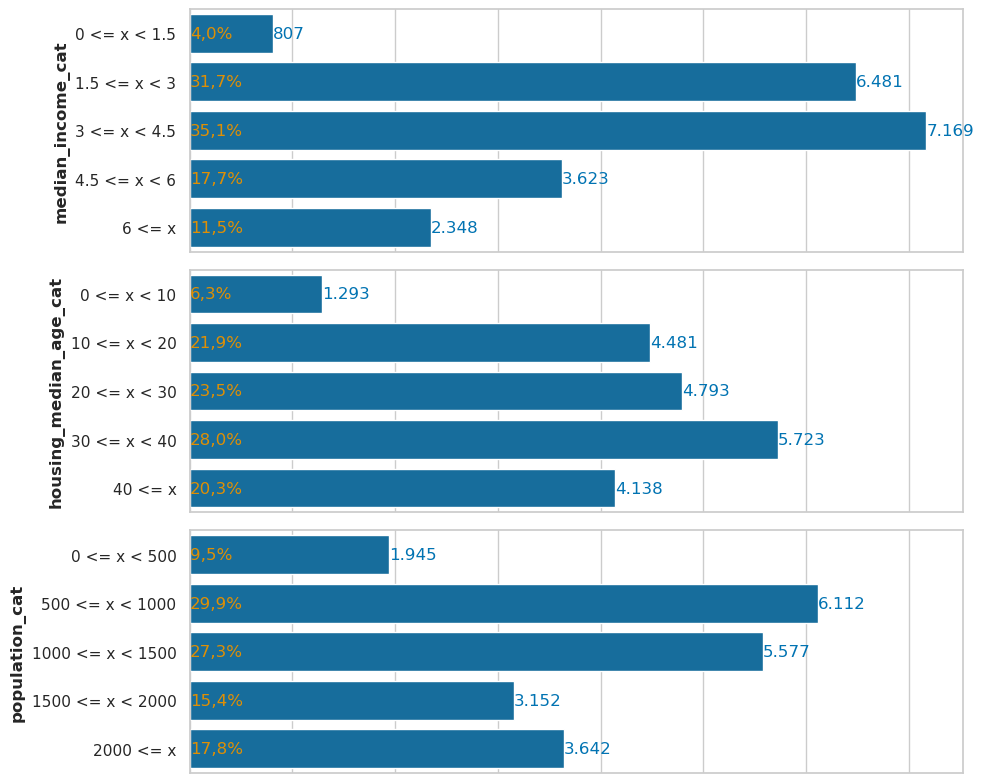

In [25]:
colunas_faixas = ['median_income_cat', 'housing_median_age_cat', 'population_cat']

fig, axs = plt.subplots(nrows=len(colunas_faixas), ncols=1, figsize=(10, 8), sharex=True)

for ax, coluna in zip(axs.flatten(), colunas_faixas):
    sns.countplot(data=df, y=coluna, ax=ax,) # Criando o gráfico de barras

    ax.set_ylabel(coluna, weight='bold')
    ax.set_xlabel(None)
    ax.set_xticklabels([])

    # Adicionar os valores e percentuais em cada barra
    df_aux = pd.DataFrame()
    df_aux['quantidade'] = df[coluna].value_counts(normalize=False).sort_index().values
    df_aux['percentual'] = df[coluna].value_counts(normalize=True ).sort_index().values

    for i, quantidade, percentual in zip(df_aux.index, df_aux['quantidade'], df_aux['percentual']):
        ax.text(quantidade, i, f'{quantidade:,.0f}'.replace(',', '.'), va='center', color='C0')
        ax.text(0, i, f'{percentual:.1%}'.replace('.', ','), va='center', color='C1')
    del df_aux


plt.tight_layout()

plt.show()

del colunas_faixas

## Criando as colunas de proporção

In [26]:
df['rooms_per_household'] = df['total_rooms'] / df['households']
df['population_per_household'] = df['population'] / df['households']
df['bedrooms_per_room'] = df['total_bedrooms'] / df['total_rooms']

# todas se tornam o menor float possível de acordo com o conteúdo
df['rooms_per_household'] = pd.to_numeric(df['rooms_per_household'], downcast='float')
df['population_per_household'] = pd.to_numeric(df['population_per_household'], downcast='float')
df['bedrooms_per_room'] = pd.to_numeric(df['bedrooms_per_room'], downcast='float')

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20428 entries, 0 to 20639
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20428 non-null  float32 
 1   latitude                  20428 non-null  float32 
 2   housing_median_age        20428 non-null  uint8   
 3   total_rooms               20428 non-null  uint16  
 4   total_bedrooms            20428 non-null  uint16  
 5   population                20428 non-null  uint16  
 6   households                20428 non-null  uint16  
 7   median_income             20428 non-null  float32 
 8   median_house_value        20428 non-null  uint32  
 9   ocean_proximity           20428 non-null  category
 10  median_income_cat         20428 non-null  category
 11  housing_median_age_cat    20428 non-null  category
 12  population_cat            20428 non-null  category
 13  rooms_per_household       20428 non-null  float32 


In [27]:
fnc_describe_numericas_personalizado(df)

/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)
/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)


,tipo,inteiros,nulo,count,nulo/count,soma,unicos,moda,mean,std,AMP,MAD,VAR,CV,qtd_3SZ<,qtd_LOWER,qtd_01%,3SZ<,LOWER,min,01%,25%,50%,75%,99%,max,UPPER,3SZ>,qtd_99%,qtd_UPPER,qtd_3SZ>,skewness,kurtosis,dist_normal,pvalue,teste_normalidade
longitude,float32,0.010329,0,20428,0,-2442596.000000,844,-118.309998,-119.570984,2.003729,10.040001,1.830928,4.014930,-1.675765,0,0,200,-125.582171,-127.485001,-124.349998,-123.220001,-121.800003,-118.500000,-118.010002,-116.290001,-114.309998,-112.324997,-113.559797,202,0,0,-0.295758,-1.332863,False,0,Kolmogorov-Smirnov
latitude,float32,0.012826,0,20428,0,727926.750000,861,34.060001,35.633774,2.136300,9.410000,1.975556,4.563776,5.995154,0,0,188,29.224875,28.244999,32.540001,32.680000,33.930000,34.259998,37.720001,40.627300,41.950001,43.405003,42.042673,205,0,0,0.464586,-1.119738,False,0,Kolmogorov-Smirnov
housing_median_age,uint8,1.000000,0,20428,0,584848.000000,52,52.000000,28.629724,12.590156,51.000000,10.556947,158.512030,43.975822,0,0,124,-9.140744,-10.500000,1.000000,4.000000,18.000000,29.000000,37.000000,52.000000,52.000000,65.500000,66.400192,0,0,0,0.061509,-0.801000,False,0,Kolmogorov-Smirnov
total_rooms,uint16,1.000000,0,20428,0,53863818.000000,5911,1527.000000,2636.764147,2185.451409,39318.000000,1344.603064,4776197.859385,82.883842,0,0,205,-3919.590079,-1089.875000,2.000000,162.539993,1450.000000,2127.000000,3143.250000,11245.139648,39320.000000,5683.125000,9193.118373,205,1289,371,4.158498,32.708691,False,0,Kolmogorov-Smirnov
total_bedrooms,uint16,1.000000,0,20428,0,10988207.000000,1923,280.000000,537.899305,421.425970,6444.000000,270.964212,177599.848136,78.346626,0,0,201,-726.378605,-230.500000,1.000000,36.000000,296.000000,435.000000,647.000000,2221.459961,6445.000000,1173.500000,1802.177215,205,1271,368,3.459217,21.981022,False,0,Kolmogorov-Smirnov
population,uint16,1.000000,0,20428,0,29112601.000000,3879,891.000000,1425.132220,1133.277418,35679.000000,713.741433,1284317.705482,79.520859,0,0,204,-1974.700033,-614.500000,3.000000,88.000000,788.000000,1166.000000,1723.000000,5809.189941,35682.000000,3125.500000,4824.964474,205,1190,339,4.959935,74.057678,False,0,Kolmogorov-Smirnov
households,uint16,1.000000,0,20428,0,10203541.000000,1809,306.000000,499.488007,382.326831,6081.000000,247.067329,146173.806044,76.543747,0,0,201,-647.492488,-206.000000,1.000000,31.000000,280.000000,409.000000,604.000000,1985.729980,6082.000000,1090.000000,1646.468501,205,1210,362,3.413596,22.090967,False,0,Kolmogorov-Smirnov
median_income,float32,0.006413,0,20428,0,79085.718750,12824,3.125000,3.871437,1.899430,14.500200,1.401543,3.607834,49.062660,0,0,205,-1.826853,-0.707613,0.499900,1.069283,2.563400,3.537500,4.744075,10.597020,15.000100,8.015087,9.569727,205,670,340,1.644229,4.941729,False,0,Kolmogorov-Smirnov
median_house_value,uint32,1.000000,0,20428,0,4224958354.000000,3833,500001.000000,206821.928432,115412.337452,485002.000000,91166.659650,13320007636.149870,55.802757,0,0,195,-139415.083925,-98362.500000,14999.000000,50000.000000,119475.000000,179700.000000,264700.000000,500001.000000,500001.000000,482537.500000,553058.940788,0,1064,0,0.978984,0.330510,False,0,Kolmogorov-Smirnov
rooms_per_household,float32,0.004553,0,20428,0,110950.367188,19197,5.000000,5.431289,2.483184,141.062927,1.118561,6.166203,45.719975,0,45,205,-2.018263,2.024914,0.846154,2.587977,4.441394,5.230769,6.052381,10.367684,141.909088,8.468862,12.880840,205,463,133,20.682894,875.558167,False,0,Kolmogorov-Smirnov


## Analisando correlação com a coluna target [median_house_value] após a engenharia de atributos

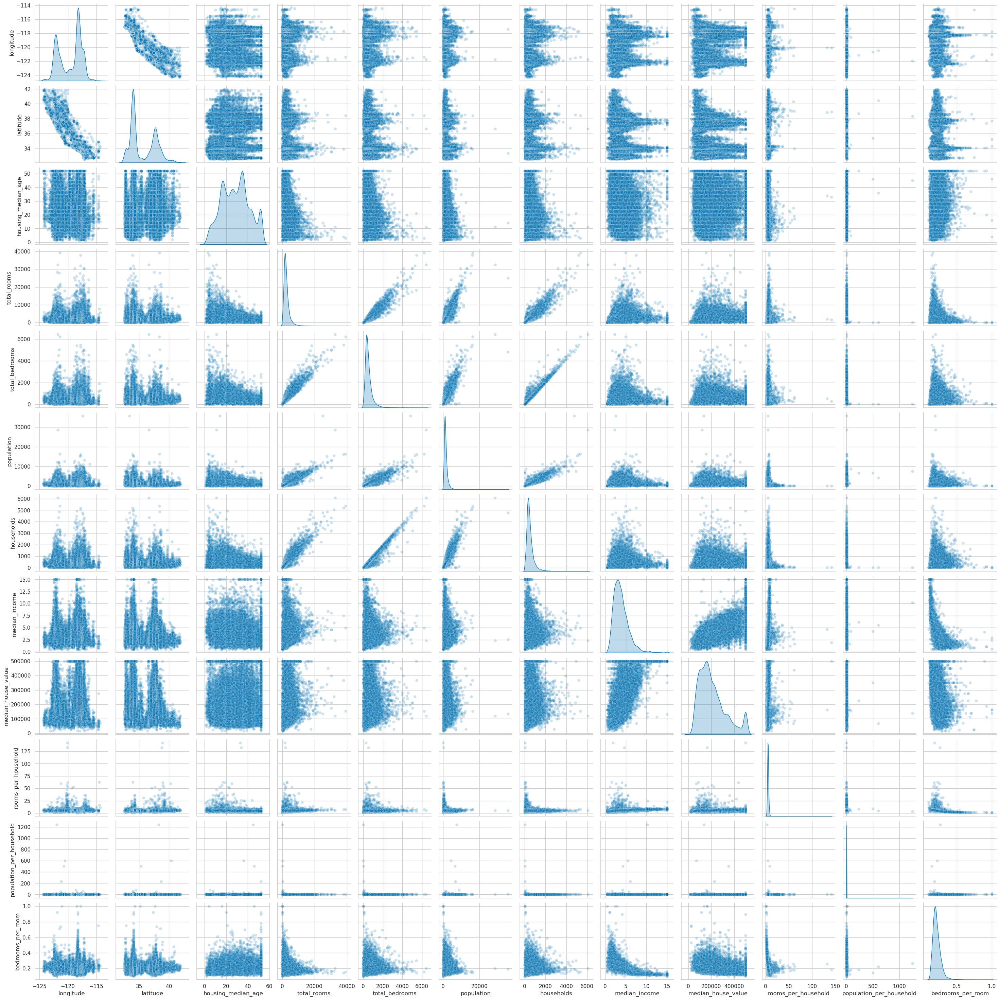

In [28]:
sns.pairplot(df, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA));

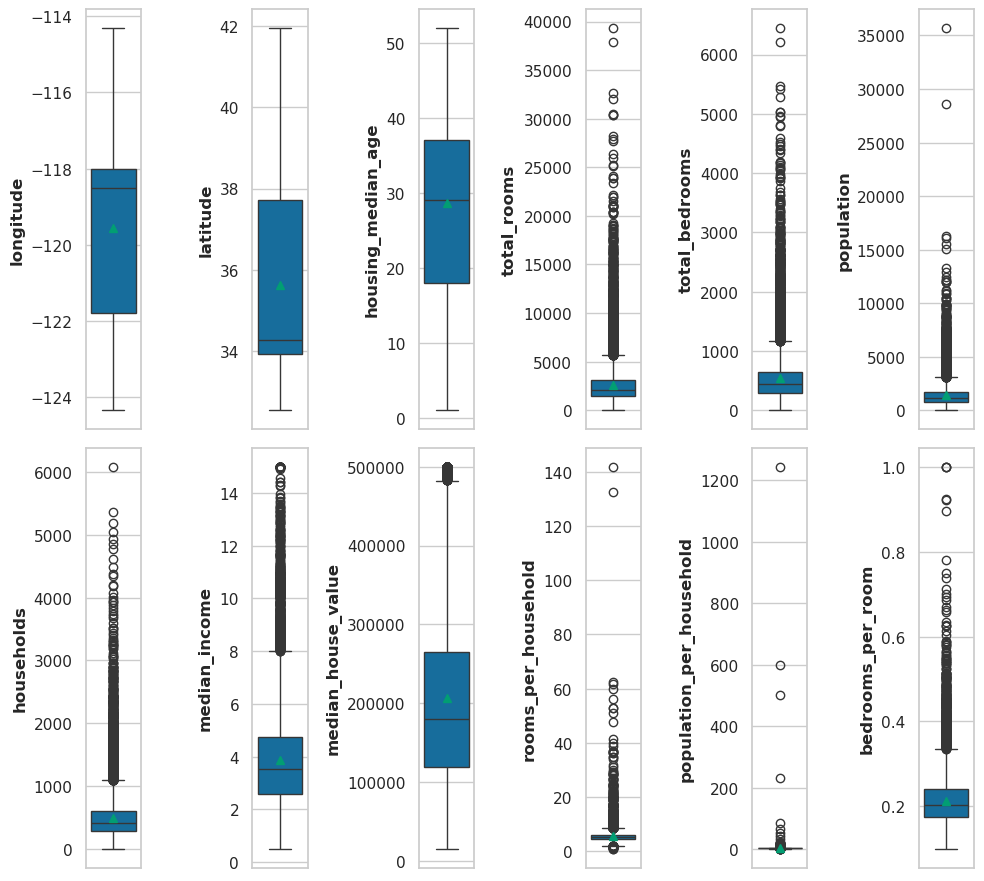

In [29]:
fig, axs = plt.subplots(2, 6, figsize=(10, 9))

for ax, coluna in zip(axs.flatten(), df.select_dtypes('number').columns):
    sns.boxplot(data=df, y=coluna, ax=ax, showmeans=True)
    ax.set_ylabel(ax.get_ylabel(), weight='bold')

plt.tight_layout()

plt.show()

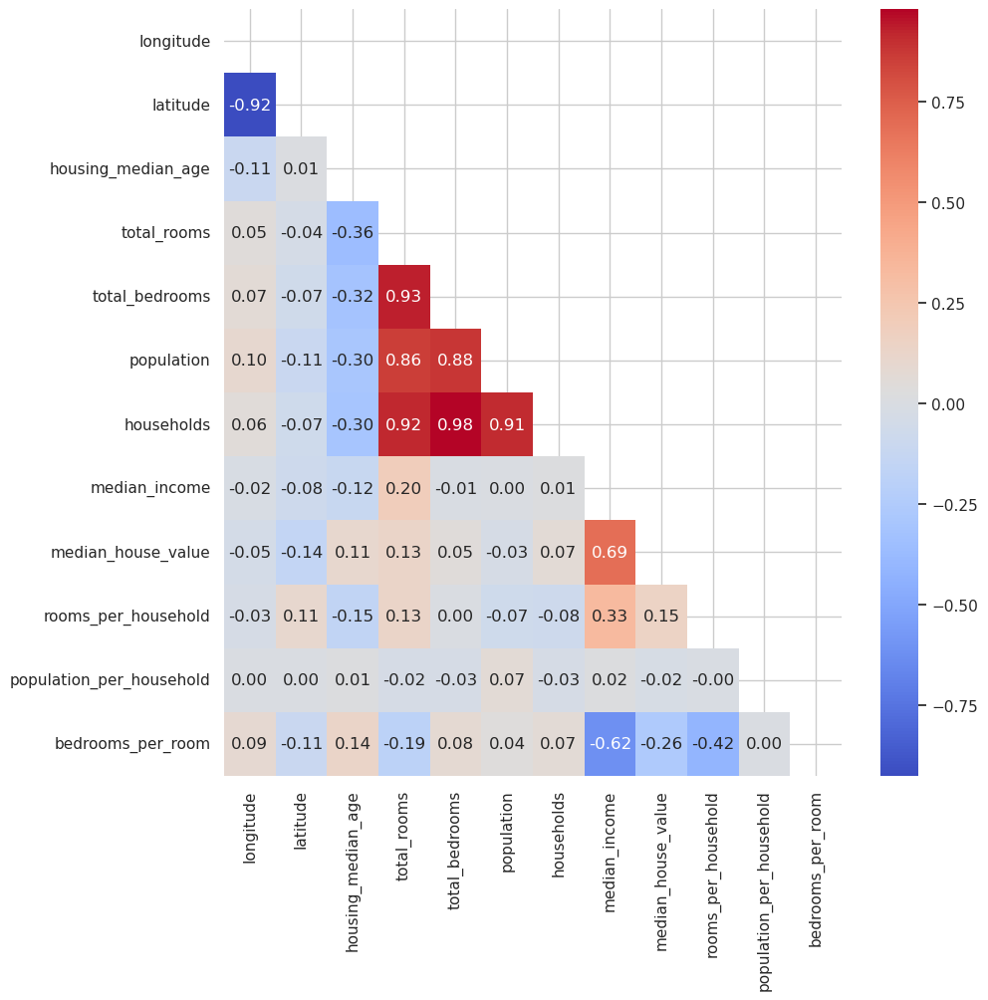

,bedrooms_per_room,latitude,longitude,population,population_per_household,total_bedrooms,households,housing_median_age,total_rooms,rooms_per_household,median_income,median_house_value
median_house_value,-0.26,-0.14,-0.05,-0.03,-0.02,0.05,0.07,0.11,0.13,0.15,0.69,1.00


In [30]:
fnc_correlacao_formatada(df, coluna_target=coluna_target[0], flg_mostrar_dataframe=True, palette=PALETTE_TEMPERATURA)

### Analisando os gráficos e dados acima

- As novas colunas numéricas também não se aproximam de uma normal
- Apesar de graficamente/visualmente não se perceber correlação com a coluna target, uma analise de correlação permitiu ver uma leve correlação das novas colunas 'bedrooms_per_room' e 'rooms_per_household'.
- 'median_income' e 'housing_median_age' também tem correlação relevante;
- Como já citado anteriormente, 'median_income' e localidade[longitude e latitude] seriam importantes para o modelo.

Ainda temos as colunas categóricas que podem ter algum efeito positivo para algum modelo. Mais adiante poderemos analisar seu impacto.

Mas pelos gráficos o que ainda chama atenção é o visível 'teto' da variável target que pode prejudar o futuro treinamento. O mesmo vale para 'housing_median_age' onde moda e max se coincidem.
No caso de 'median_income', apesar de um visível teto, o mesmo não coincide com a moda. Mas ainda pode ser um problema para o treinamento.

### Salvando a base completa com outliers

In [31]:
df.to_parquet(path=DADOS_COMPLETOS, index=False)

# Limpeza dos dados

In [32]:
for coluna in ('median_house_value', 'median_income', 'housing_median_age'):
    print(f'{coluna} = valor_teto {df[coluna].max()} | percentual {df[df[coluna] == df[coluna].max()].shape[0] / df.shape[0]:.2%}')

median_house_value = valor_teto 500001 | percentual 4.69%
median_income = valor_teto 15.000100135803223 | percentual 0.23%
housing_median_age = valor_teto 52 | percentual 6.18%


Temos um percentual considerável a perder removendo os tetos. Mas da mesma forma, deixar esses dados para treinamento pode piorar o modelo.

Abaixo podemos avaliar se mantemos os registros com esse teto, se tiramos um percentil da base, ou se simplemente eliminamos os registros que foram aparentemente fixados nesse teto.

Para isso podemos avaliar as méticas de outliers mostradas no describe personalizado da função 'fnc_describe_numericas_personalizado' ['99%','UPPER', '3SZ>', 'qtd_99%', 'qtd_UPPER' e 'qtd_3SZ>'].

In [33]:
df_describe = fnc_describe_numericas_personalizado(df, flg_mostrar_dataframe=False, flg_retornar_dataframe=True)

df_describe[
    ['max', '99%','UPPER', '3SZ>', 'qtd_99%', 'qtd_UPPER', 'qtd_3SZ>', 'mean', 'std', 'AMP']
].style.background_gradient(
    cmap=PALETTE_TEMPERATURA,
    subset=['max', '99%','UPPER', '3SZ>', 'mean'],
    axis='columns',
)

/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)
/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)


,max,99%,UPPER,3SZ>,qtd_99%,qtd_UPPER,qtd_3SZ>,mean,std,AMP
longitude,-114.309998,-116.290001,-112.324997,-113.559797,202,0,0,-119.570984,2.003729,10.040001
latitude,41.950001,40.627300,43.405003,42.042673,205,0,0,35.633774,2.136300,9.410000
housing_median_age,52.000000,52.000000,65.500000,66.400192,0,0,0,28.629724,12.590156,51.000000
total_rooms,39320.000000,11245.139648,5683.125000,9193.118373,205,1289,371,2636.764147,2185.451409,39318.000000
total_bedrooms,6445.000000,2221.459961,1173.500000,1802.177215,205,1271,368,537.899305,421.425970,6444.000000
population,35682.000000,5809.189941,3125.500000,4824.964474,205,1190,339,1425.132220,1133.277418,35679.000000
households,6082.000000,1985.729980,1090.000000,1646.468501,205,1210,362,499.488007,382.326831,6081.000000
median_income,15.000100,10.597020,8.015087,9.569727,205,670,340,3.871437,1.899430,14.500200
median_house_value,500001.000000,500001.000000,482537.500000,553058.940788,0,1064,0,206821.928432,115412.337452,485002.000000
rooms_per_household,141.909088,10.367684,8.468862,12.880840,205,463,133,5.431289,2.483184,141.062927


In [34]:
df['housing_median_age'].value_counts().to_frame().head(2)

,count
housing_median_age,
52,1262
36,856


Para a coluna target [median_house_value], 99% não é suficente, ja que vimos acima que 4.69% era o tamanho do teto.
3x o score Z não faz sentido por sei maior que o teto/max e o UPPER perde muito na distancia entre o maior valor que resta.
Nesse caso, podemos apenas remover os registros que contém o teto, que seria os 4.69%.

Para a coluna 'median_income', cujo teto não é o mais frequente, mas evidentemente foi forçado, podemos tomar a mesma medida de só remover o valor máximo. Qualquer outra escolha vai reduzir bastante esse máximo. Pelo boxplot feito anteriomente, vemos que ele tem seus outliers espalhados, indicando serem valores reais, apesar de elevados. No futuro podemos remover mais se ajudar o modelo.

Quanto ao 'housing_median_age', nenhuma métrica parece ser adequada para remover os registros. Seu boxplot não mostra outliers e é uma variável de baixa amplitude e desvio padrão alto. Mas quando criamos a categórica relacionada, vimos uma concentração grande sobre o 52(1262 observações). Vamos deixar essa variável sem alteração por enquanto.

In [35]:
df_clean = df.copy()

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20428 entries, 0 to 20639
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20428 non-null  float32 
 1   latitude                  20428 non-null  float32 
 2   housing_median_age        20428 non-null  uint8   
 3   total_rooms               20428 non-null  uint16  
 4   total_bedrooms            20428 non-null  uint16  
 5   population                20428 non-null  uint16  
 6   households                20428 non-null  uint16  
 7   median_income             20428 non-null  float32 
 8   median_house_value        20428 non-null  uint32  
 9   ocean_proximity           20428 non-null  category
 10  median_income_cat         20428 non-null  category
 11  housing_median_age_cat    20428 non-null  category
 12  population_cat            20428 non-null  category
 13  rooms_per_household       20428 non-null  float32 


In [36]:
print('df_clean.shape =', df_clean.shape)

df_clean = df_clean[df_clean['median_house_value'] < 500_001.0]

print('df_clean.shape =', df_clean.shape)

df_clean = df_clean[df_clean['median_income'] < 15.0001]

print('df_clean.shape =', df_clean.shape)

df_clean.shape = (20428, 16)
df_clean.shape = (19470, 16)
df_clean.shape = (19467, 16)


In [37]:
1 - df_clean.shape[0] / df.shape[0]

0.047043273937732555

In [38]:
df['housing_median_age'].value_counts().to_frame().head(2)

,count
housing_median_age,
52,1262
36,856


A 'housing_median_age' igual a 52 não perdeu nenhum registro filtrando anteriormente outras colunas.
Podemos eliminar mais regisros filtrando o valor 52 e posteriormente o futuro modelo só deve ser aplicado até 51 anos de idade do imóvel.

In [39]:
print('df_clean.shape =', df_clean.shape)

df_clean = df_clean[df_clean['housing_median_age'] < 52]

print('df_clean.shape =', df_clean.shape)

df_clean.shape = (19467, 16)
df_clean.shape = (18375, 16)


In [40]:
1 - df_clean.shape[0] / df.shape[0]

0.10049931466614448

In [41]:
fnc_describe_numericas_personalizado(df_clean)

/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)
/dados/app/conda/envs/california/lib/python3.12/site-packages/pandas/core/dtypes/cast.py:377: RuntimeWarning: invalid value encountered in cast
  new_result = trans(result).astype(dtype)


,tipo,inteiros,nulo,count,nulo/count,soma,unicos,moda,mean,std,AMP,MAD,VAR,CV,qtd_3SZ<,qtd_LOWER,qtd_01%,3SZ<,LOWER,min,01%,25%,50%,75%,99%,max,UPPER,3SZ>,qtd_99%,qtd_UPPER,qtd_3SZ>,skewness,kurtosis,dist_normal,pvalue,teste_normalidade
longitude,float32,0.011048,0,18375,0,-2195533.250000,840,-118.300003,-119.484802,1.980712,9.990005,1.794863,3.923221,-1.657711,0,0,183,-125.426939,-126.920006,-124.300003,-123.230003,-121.550003,-118.449997,-117.970001,-116.220001,-114.309998,-112.599998,-113.542666,180,0,0,-0.342806,-1.250737,False,0,Kolmogorov-Smirnov
latitude,float32,0.013388,0,18375,0,654037.375000,859,34.020000,35.593872,2.148157,9.410000,1.972100,4.614579,6.035188,0,0,184,29.149401,28.294998,32.540001,32.677399,33.919998,34.240002,37.669998,40.660000,41.950001,43.294998,42.038343,182,0,0,0.519599,-1.048917,False,0,Kolmogorov-Smirnov
housing_median_age,uint8,1.000000,0,18375,0,495587.000000,51,36.000000,26.970721,11.432787,50.000000,9.684143,130.708623,42.389626,0,0,118,-7.327641,-11.500000,1.000000,4.000000,17.000000,27.000000,36.000000,49.000000,51.000000,64.500000,61.269083,165,0,0,-0.055568,-0.856935,False,0,Kolmogorov-Smirnov
total_rooms,uint16,1.000000,0,18375,0,49061900.000000,5721,1527.000000,2670.035374,2227.835992,39318.000000,1369.701416,4963253.205236,83.438446,0,0,184,-4013.472600,-1128.000000,2.000000,192.740005,1458.000000,2142.000000,3182.000000,11639.940430,39320.000000,5768.000000,9353.543349,184,1165,334,4.184770,32.773060,False,0,Kolmogorov-Smirnov
total_bedrooms,uint16,1.000000,0,18375,0,10071005.000000,1900,280.000000,548.081905,429.434643,6443.000000,276.397797,184414.112209,78.352272,0,0,184,-740.222023,-238.500000,2.000000,41.740002,300.000000,442.000000,659.000000,2279.780029,6445.000000,1197.500000,1836.385832,184,1143,336,3.425934,21.216728,False,0,Kolmogorov-Smirnov
population,uint16,1.000000,0,18375,0,27013913.000000,3843,1052.000000,1470.144925,1163.854700,35679.000000,733.211060,1354557.763310,79.165985,0,0,182,-2021.419176,-641.000000,3.000000,98.000000,811.000000,1203.000000,1779.000000,6037.379883,35682.000000,3231.000000,4961.709026,184,1046,301,4.956053,73.054626,False,0,Kolmogorov-Smirnov
households,uint16,1.000000,0,18375,0,9347284.000000,1785,386.000000,508.695728,389.547420,6080.000000,251.967300,151747.192218,76.577690,0,0,184,-659.946531,-211.000000,2.000000,36.740002,284.000000,416.000000,614.000000,2040.260010,6082.000000,1109.000000,1677.337987,184,1099,330,3.382600,21.354431,False,0,Kolmogorov-Smirnov
median_income,float32,0.006313,0,18375,0,67851.718750,11642,3.125000,3.692611,1.565343,12.647800,1.237289,2.450297,42.391216,0,0,184,-1.003417,-0.582550,0.499900,1.095396,2.537000,3.470500,4.616700,8.150486,13.147700,7.736250,8.388638,184,307,142,0.858259,1.054228,False,0,Kolmogorov-Smirnov
median_house_value,uint32,1.000000,0,18375,0,3482499497.000000,3755,137500.000000,189523.782150,95732.142771,485001.000000,76355.187500,9164643159.588274,50.511944,0,0,182,-97672.646164,-76150.000000,14999.000000,50000.000000,115400.000000,171200.000000,243100.000000,458756.000000,500000.000000,434650.000000,476720.210464,184,378,105,0.834552,0.260258,False,0,Kolmogorov-Smirnov
rooms_per_household,float32,0.004245,0,18375,0,99009.625000,17347,5.000000,5.388279,2.342782,131.687180,1.077259,5.488629,43.479233,0,45,184,-1.640068,2.095558,0.846154,2.651424,4.431930,5.211966,5.989511,10.518933,132.533340,8.325882,12.416626,184,374,133,16.607349,603.736694,False,0,Kolmogorov-Smirnov


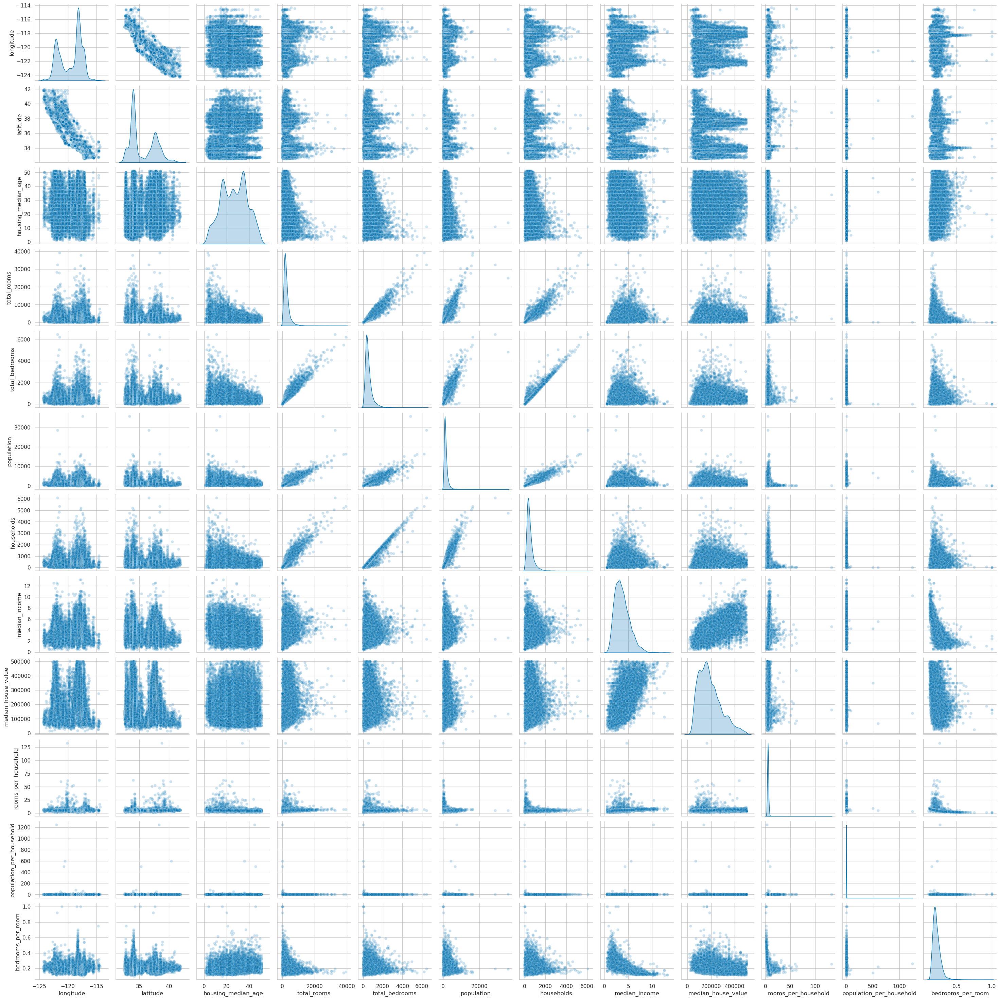

In [42]:
sns.pairplot(df_clean, diag_kind='kde', plot_kws=dict(alpha=SCATTER_ALPHA));

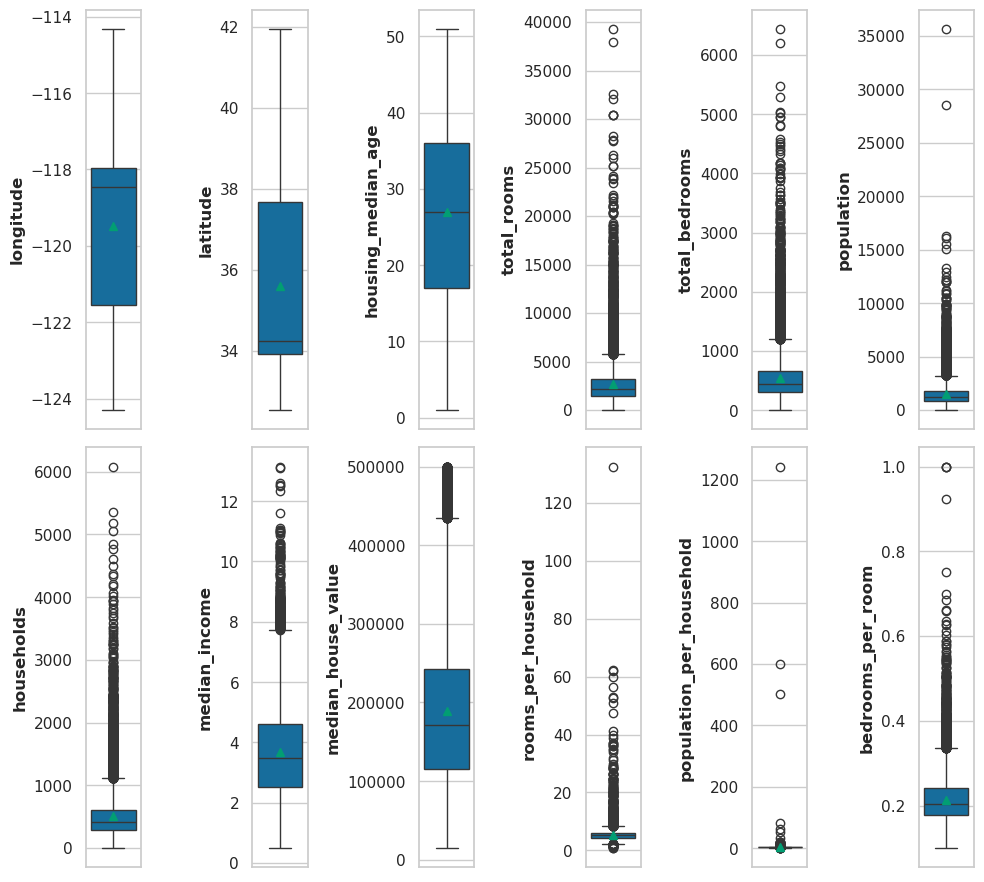

In [43]:
fig, axs = plt.subplots(2, 6, figsize=(10, 9))

for ax, coluna in zip(axs.flatten(), df_clean.select_dtypes('number').columns):
    sns.boxplot(data=df_clean, y=coluna, ax=ax, showmeans=True)
    ax.set_ylabel(ax.get_ylabel(), weight='bold')

plt.tight_layout()

plt.show()

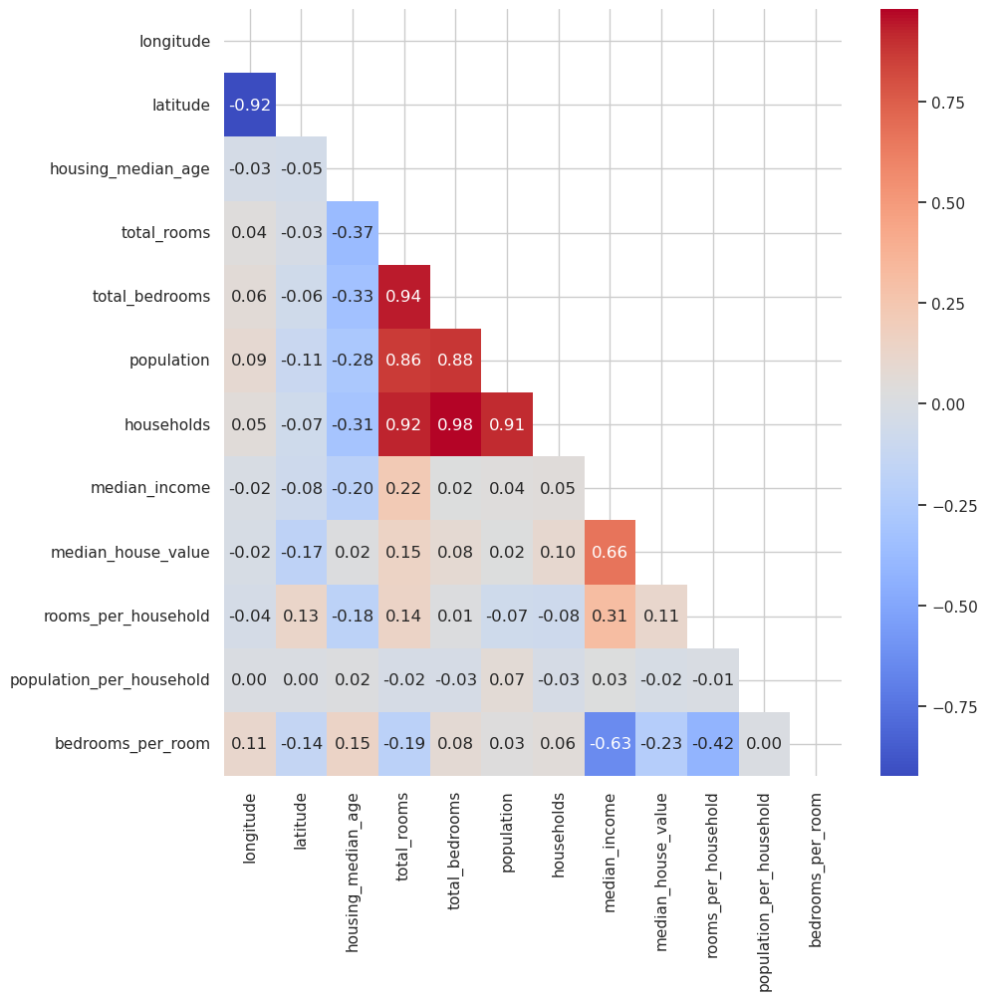

,bedrooms_per_room,latitude,longitude,population_per_household,housing_median_age,population,total_bedrooms,households,rooms_per_household,total_rooms,median_income,median_house_value
median_house_value,-0.23,-0.17,-0.02,-0.02,0.02,0.02,0.08,0.10,0.11,0.15,0.66,1.00


In [44]:
fnc_correlacao_formatada(df_clean, coluna_target=coluna_target[0], flg_mostrar_dataframe=True, palette=PALETTE_TEMPERATURA)

Correlações antigas

In [45]:
fnc_correlacao_formatada(df, coluna_target=coluna_target[0], flg_mostrar_heatmap=False, flg_mostrar_dataframe=True, palette=PALETTE_TEMPERATURA)

,bedrooms_per_room,latitude,longitude,population,population_per_household,total_bedrooms,households,housing_median_age,total_rooms,rooms_per_household,median_income,median_house_value
median_house_value,-0.26,-0.14,-0.05,-0.03,-0.02,0.05,0.07,0.11,0.13,0.15,0.69,1.00


## Analizando os gráficos dos dados após a limpeza das variáveis númericas

- A limpeza nos custou 10% da base e já tinhamos perdido 1% ao remover nulos;
- Pelo pairplot percebemos claramente que tivemos sucesso em remover os tetos inseridos manualmente;
- Também tivemos uma variação considerável nas correlações após a limpeza. Alguma variáveis reduziram sua correlação com o target e outra aumentaram;

Lembrando que ainda podemos ter influência das variáveis categóricas no futuro modelo.

# Salvando a base com dados limpos

In [46]:
df_clean.to_parquet(path=DADOS_LIMPOS, index=False)